# Phase 1

Install Required Packages

In [1]:
!pip install -q ultralytics tqdm opencv-python-headless matplotlib pyyaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 76.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 71.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 26.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 11.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 65.5 MB/s eta 0:00:00:00:0100:01


Create Project Folder Structure

In [66]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


In [2]:
from pathlib import Path

PROJECT_ROOT = Path('./kitti_phase1')
EXTRACT_DIR = PROJECT_ROOT / 'kitti_extracted'   # kept for parity with original notebook
YOLO_DIR = PROJECT_ROOT / 'kitti_yolo'

for d in [EXTRACT_DIR, YOLO_DIR]:
    d.mkdir(parents=True, exist_ok=True)

(YOLO_IMAGES_TRAIN := YOLO_DIR / 'images' / 'train').mkdir(parents=True, exist_ok=True)
(YOLO_LABELS_TRAIN := YOLO_DIR / 'labels' / 'train').mkdir(parents=True, exist_ok=True)
(YOLO_IMAGES_VAL   := YOLO_DIR / 'images' / 'val').mkdir(parents=True, exist_ok=True)
(YOLO_LABELS_VAL   := YOLO_DIR / 'labels' / 'val').mkdir(parents=True, exist_ok=True)

PROJECT_ROOT, EXTRACT_DIR, YOLO_DIR

(PosixPath('kitti_phase1'),
 PosixPath('kitti_phase1/kitti_extracted'),
 PosixPath('kitti_phase1/kitti_yolo'))

Select KITTI Paths from Kaggle Input

In [3]:
from pathlib import Path

KAGGLE_KITTI = Path("/kaggle/input/kitti-dataset")

# You asked specifically to work only with these subfolders:
TRAIN_IMAGES_DIR = KAGGLE_KITTI / "data_object_image_2" / "training" / "image_2"
TEST_IMAGES_DIR  = KAGGLE_KITTI / "data_object_image_2" / "testing" / "image_2"
LABELS_DIR       = KAGGLE_KITTI / "data_object_label_2" / "training" / "label_2"

# For the cleaning/conversion pipeline we operate on the TRAIN images that have labels.
IMAGES_DIR = TRAIN_IMAGES_DIR

print("Train images folder:", TRAIN_IMAGES_DIR)
print("Test  images folder:", TEST_IMAGES_DIR)
print("Labels folder      :", LABELS_DIR)
print("Number of TRAIN images:", len(list(TRAIN_IMAGES_DIR.glob('*.png'))))
print("Number of TEST  images:", len(list(TEST_IMAGES_DIR.glob('*.png'))))
print("Number of TRAIN labels:", len(list(LABELS_DIR.glob('*.txt'))))

Train images folder: /kaggle/input/kitti-dataset/data_object_image_2/training/image_2
Test  images folder: /kaggle/input/kitti-dataset/data_object_image_2/testing/image_2
Labels folder      : /kaggle/input/kitti-dataset/data_object_label_2/training/label_2
Number of TRAIN images: 7481
Number of TEST  images: 7518
Number of TRAIN labels: 7481


Define Image and Label Directories, Preview a Sample Image, and Preview the Matching Label File

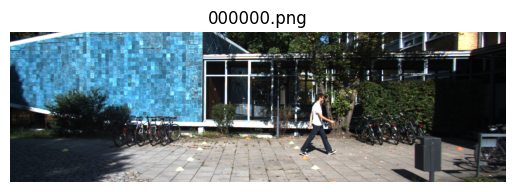

Label file: 000000.txt
Pedestrian 0.00 0 -0.20 712.40 143.00 810.73 307.92 1.89 0.48 1.20 1.84 1.47 8.41 0.01


In [4]:
import cv2, matplotlib.pyplot as plt

sample_img_path = sorted(IMAGES_DIR.glob('*.png'))[0]
img = cv2.cvtColor(cv2.imread(str(sample_img_path)), cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.axis('off')
plt.title(sample_img_path.name)
plt.show()

sample_lbl_path = LABELS_DIR / (sample_img_path.stem + '.txt')
print("Label file:", sample_lbl_path.name)
print("\n".join(open(sample_lbl_path).read().splitlines()[:10]))

Check for Missing or Empty Labels

In [5]:
from tqdm import tqdm

images = sorted(IMAGES_DIR.glob('*.png'))
labels = sorted(LABELS_DIR.glob('*.txt'))
img_set = {p.stem for p in images}
lbl_set = {p.stem for p in labels}

imgs_without_lbl = [p for p in images if p.stem not in lbl_set]
lbl_without_imgs = [p for p in labels if p.stem not in img_set]
empty_label_files = [p for p in labels if p.stat().st_size == 0]

print("Images without label:", len(imgs_without_lbl))
print("Labels without image:", len(lbl_without_imgs))
print("Empty label files:", len(empty_label_files))

Images without label: 0
Labels without image: 0
Empty label files: 0


Remove Missing/Empty Label Files

In [6]:
valid_labels = {p.stem for p in labels if p.stat().st_size > 0}
images = [p for p in images if p.stem in valid_labels]  # keep images with non-empty label
print("Usable images after removing missing/empty labels:", len(images))

CLEAN_REPORT = {
    "imgs_without_lbl": [p.name for p in imgs_without_lbl],
    "lbl_without_imgs": [p.name for p in lbl_without_imgs],
    "empty_label_files": [p.name for p in empty_label_files],
}

Usable images after removing missing/empty labels: 7481


Remove Duplicate Images

In [7]:
# --- Robust duplicate detection on Kaggle FUSE (handles Errno 512) ---
import hashlib, time, os

def file_md5_resilient(path, chunk=1<<20, retries=3, pause=0.3):
    """MD5 with small retries to tolerate transient FUSE read errors."""
    for attempt in range(1, retries+1):
        try:
            h = hashlib.md5()
            with open(path, "rb") as f:
                while True:
                    data = f.read(chunk)
                    if not data:
                        break
                    h.update(data)
            return h.hexdigest()
        except OSError as e:
            if attempt == retries:
                raise
            time.sleep(pause)
    return None  # should not reach

hash_seen = set()
unique_images = []
dupe_images = []
unreadable_images = []

for p in images:
    try:
        h = file_md5_resilient(p)
        if h in hash_seen:
            dupe_images.append(p)
        else:
            hash_seen.add(h)
            unique_images.append(p)
    except OSError as e:
        # Skip files that the FUSE mount refuses to read; log for report
        unreadable_images.append(p)

# keep only readable, non-duplicate files
images = unique_images

print("Removed duplicate images:", len(dupe_images))
print("Skipped unreadable images (FUSE error):", len(unreadable_images))

CLEAN_REPORT["duplicate_images"]  = [p.name for p in dupe_images]
CLEAN_REPORT["unreadable_images"] = [p.name for p in unreadable_images]

Removed duplicate images: 0
Skipped unreadable images (FUSE error): 0


Visualize Bounding Boxes on a Sample Image

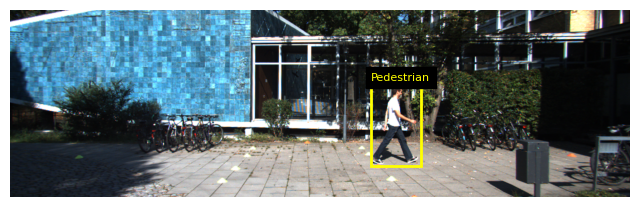

In [8]:
import matplotlib.patches as patches

def read_kitti_objects(lbl_path):
    objs = []
    for line in open(lbl_path).read().splitlines():
        parts = line.split()
        if len(parts) < 8:
            continue
        cls = parts[0]
        try:
            x1, y1, x2, y2 = map(float, parts[4:8])
            objs.append({'cls': cls, 'bbox': [x1, y1, x2, y2]})
        except:
            continue
    return objs

fig, ax = plt.subplots(figsize=(8,5))
ax.imshow(img)
ax.axis('off')

objs = read_kitti_objects(sample_lbl_path)
for o in objs[:10]:
    x1, y1, x2, y2 = o['bbox']
    rect = patches.Rectangle((x1,y1), x2-x1, y2-y1, linewidth=2, edgecolor='yellow', facecolor='none')
    ax.add_patch(rect)
    ax.text(x1, y1-3, o['cls'], fontsize=8, color='yellow', backgroundcolor='black')
plt.show()

Define Classes and Label Conversion Functions

In [9]:
CLASSES = ['Car', 'Pedestrian', 'Cyclist']
CLASS_TO_ID = {c:i for i,c in enumerate(CLASSES)}

def kitti_to_yolo_bbox(x1, y1, x2, y2, W, H):
    x_center = ((x1 + x2) / 2.0) / W
    y_center = ((y1 + y2) / 2.0) / H
    w = (x2 - x1) / W
    h = (y2 - y1) / H
    return x_center, y_center, w, h

Convert KITTI Labels to YOLO Format with Outlier Filtering

In [10]:
def convert_file_to_yolo(img_path, lbl_path):
    import cv2, math
    H, W = cv2.imread(str(img_path)).shape[:2]
    lines_out = []
    min_area_frac = 1e-5      # drop boxes smaller than this fraction of image area
    max_area_frac = 0.8       # drop boxes that cover almost whole image
    max_aspect = 20.0         # drop boxes with extreme aspect ratio

    for line in open(lbl_path).read().splitlines():
        parts = line.split()
        if len(parts) < 8:
            continue
        cls = parts[0]
        if cls not in CLASS_TO_ID:
            continue

        x1, y1, x2, y2 = map(float, parts[4:8])
        # clamp to image bounds
        x1, y1 = max(0.0, x1), max(0.0, y1)
        x2, y2 = min(float(W-1), x2), min(float(H-1), y2)
        if x2 <= x1 or y2 <= y1:
            continue

        # outlier checks
        bw, bh = (x2 - x1), (y2 - y1)
        area_frac = (bw * bh) / float(W * H)
        aspect = max(bw / max(bh,1e-6), bh / max(bw,1e-6))
        if area_frac < min_area_frac or area_frac > max_area_frac or aspect > max_aspect:
            continue

        xc = ((x1 + x2) / 2.0) / W
        yc = ((y1 + y2) / 2.0) / H
        w  = bw / W
        h  = bh / H
        if w <= 0 or h <= 0:
            continue

        lines_out.append(f"{CLASS_TO_ID[cls]} {xc:.6f} {yc:.6f} {w:.6f} {h:.6f}")
    return lines_out

Split Dataset into Train (80%) and Validation (20%)

In [11]:
import random, shutil
random.seed(42)

usable_images = [p for p in images if (LABELS_DIR / (p.stem + '.txt')).exists()]
random.shuffle(usable_images)

split_idx = int(0.8 * len(usable_images))
train_imgs = usable_images[:split_idx]
val_imgs = usable_images[split_idx:]

def process_split(img_paths, images_out_dir, labels_out_dir):
    images_out_dir.mkdir(parents=True, exist_ok=True)
    labels_out_dir.mkdir(parents=True, exist_ok=True)
    kept, skipped = 0, 0
    for ip in tqdm(img_paths):
        lp = LABELS_DIR / (ip.stem + '.txt')
        lines = convert_file_to_yolo(ip, lp)
        if len(lines) == 0:
            skipped += 1
            continue
        shutil.copy2(ip, images_out_dir / ip.name)
        with open(labels_out_dir / (ip.stem + '.txt'), 'w') as f:
            f.write('\n'.join(lines) + '\n')
        kept += 1
    return kept, skipped

kept_tr, skip_tr = process_split(train_imgs, YOLO_IMAGES_TRAIN, YOLO_LABELS_TRAIN)
kept_va, skip_va = process_split(val_imgs, YOLO_IMAGES_VAL, YOLO_LABELS_VAL)

print({'train_kept': kept_tr, 'train_skipped': skip_tr, 'val_kept': kept_va, 'val_skipped': skip_va})

100%|██████████| 1497/1497 [00:31<00:00, 47.37it/s]

{'train_kept': 5984, 'train_skipped': 0, 'val_kept': 1497, 'val_skipped': 0}


Write YOLO Data Configuration (data.yaml)

In [12]:
import yaml

data_yaml = {
    'path': str(YOLO_DIR.resolve()),
    'train': 'images/train',
    'val': 'images/val',
    'names': CLASSES,
}
with open(YOLO_DIR / 'data.yaml', 'w') as f:
    yaml.safe_dump(data_yaml, f, sort_keys=False)
print((YOLO_DIR / 'data.yaml').read_text())

path: /kaggle/working/kitti_phase1/kitti_yolo
train: images/train
val: images/val
names:
- Car
- Pedestrian
- Cyclist



Count Train/Val Images and Labels and Package Final YOLO Dataset as ZIP

In [13]:
n_tr_img = len(list((YOLO_IMAGES_TRAIN).glob('*.png')))
n_tr_lbl = len(list((YOLO_LABELS_TRAIN).glob('*.txt')))
n_va_img = len(list((YOLO_IMAGES_VAL).glob('*.png')))
n_va_lbl = len(list((YOLO_LABELS_VAL).glob('*.txt')))

print('Train images:', n_tr_img, '| Train labels:', n_tr_lbl)
print('Val images  :', n_va_img, '| Val labels  :', n_va_lbl)

import shutil
zip_path = PROJECT_ROOT / 'kitti_yolo_prepared.zip'
if zip_path.exists(): zip_path.unlink()
shutil.make_archive(str(zip_path.with_suffix('')), 'zip', root_dir=YOLO_DIR)
print("ZIP written to:", zip_path.resolve())

Train images: 5984 | Train labels: 5984
Val images  : 1497 | Val labels  : 1497
ZIP written to: /kaggle/working/kitti_phase1/kitti_yolo_prepared.zip


Save Cleaning Report as JSON

In [14]:
import json
CLEAN_REPORT.update({
    "train_kept": kept_tr, "train_skipped": skip_tr,
    "val_kept": kept_va,   "val_skipped": skip_va
})
with open(PROJECT_ROOT / "cleaning_report.json", "w") as f:
    json.dump(CLEAN_REPORT, f, indent=2)
print("Saved cleaning_report.json")

Saved cleaning_report.json


# Phase 2

Load YOLO Dataset Metadata

In [15]:
from pathlib import Path
import pandas as pd

YOLO_DIR = Path("/kaggle/working/kitti_phase1/kitti_yolo")

train_images = sorted((YOLO_DIR / "images" / "train").glob("*.png"))
train_labels = sorted((YOLO_DIR / "labels" / "train").glob("*.txt"))
val_images   = sorted((YOLO_DIR / "images" / "val").glob("*.png"))
val_labels   = sorted((YOLO_DIR / "labels" / "val").glob("*.txt"))

print("Train images:", len(train_images), "Train labels:", len(train_labels))
print("Val images  :", len(val_images), "Val labels  :", len(val_labels))

Train images: 5984 Train labels: 5984
Val images  : 1497 Val labels  : 1497


Parse YOLO Label Files into DataFrame

In [122]:
import numpy as np

records = []
for lbl in train_labels + val_labels:
    split = "train" if "train" in str(lbl) else "val"
    for line in open(lbl).read().splitlines():
        cls, xc, yc, w, h = line.split()
        records.append({
            "split": split,
            "image": lbl.stem + ".png",
            "class_id": int(cls),
            "x_center": float(xc),
            "y_center": float(yc),
            "width": float(w),
            "height": float(h),
        })

df = pd.DataFrame(records)

In [124]:
df.head()



,split,image,class_id,x_center,y_center,width,height
0,train,000000.png,1,0.622194,0.609351,0.080335,0.445730
1,train,000001.png,0,0.326667,0.512880,0.029130,0.057547
2,train,000001.png,2,0.549750,0.477173,0.009968,0.079947
3,train,000002.png,0,0.546481,0.551360,0.034364,0.088693
4,train,000005.png,1,0.278112,0.556507,0.024726,0.159733


In [83]:
print("Dataset size:", len(df))
print("Number of unique images:", df["image"].nunique())
print("Classes:", df["class_id"].unique())
print("Class counts:\n", df["class_id"].value_counts())


Dataset size: 34842
Number of unique images: 7481
Classes: [1 0 2]
Class counts:
 class_id
0    28731
1     4484
2     1627
Name: count, dtype: int64


# Class Diversity per Image

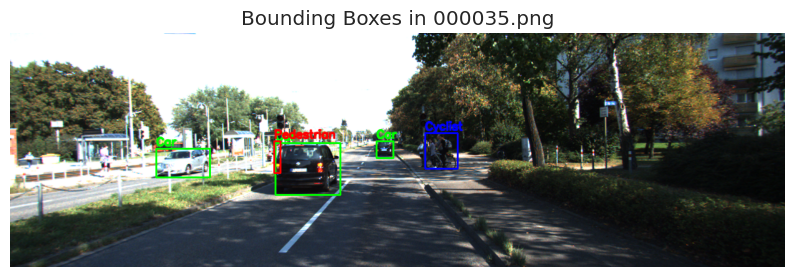

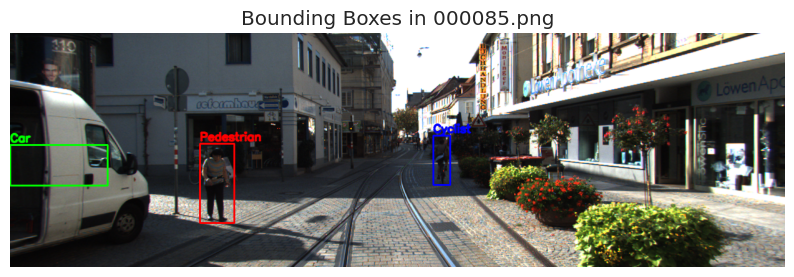

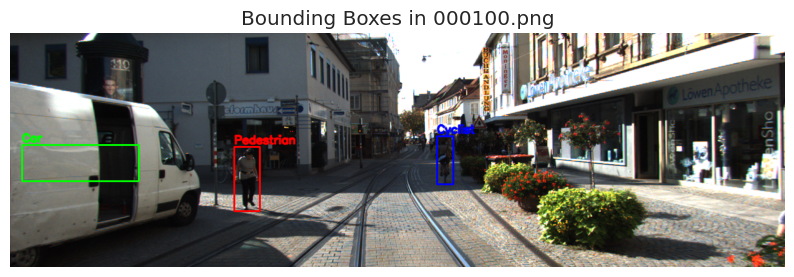

In [158]:
diverse_imgs = df.groupby("image")["class_id"].nunique()
diverse_imgs = diverse_imgs[diverse_imgs==3].index

for img_name in diverse_imgs[:3]:
    show_image_with_bboxes(img_name, df, str(IMAGES_DIR))


# Class Distribution 

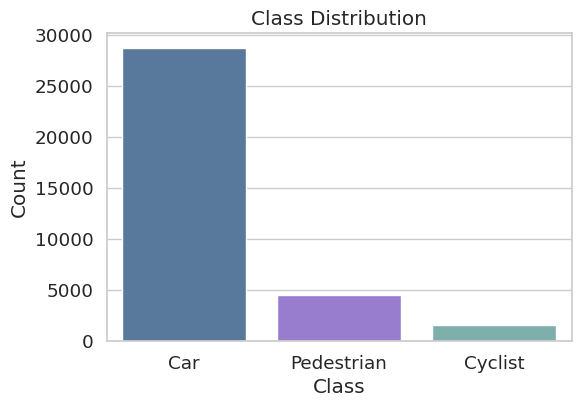

In [119]:
plt.figure(figsize=(6,4))
sns.countplot(data=df,x="class_id",palette={0: "#4E79A7",1: "#9370DB",2: "#76B7B2"})
plt.xticks([0,1,2], ['Car','Pedestrian','Cyclist'])
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()


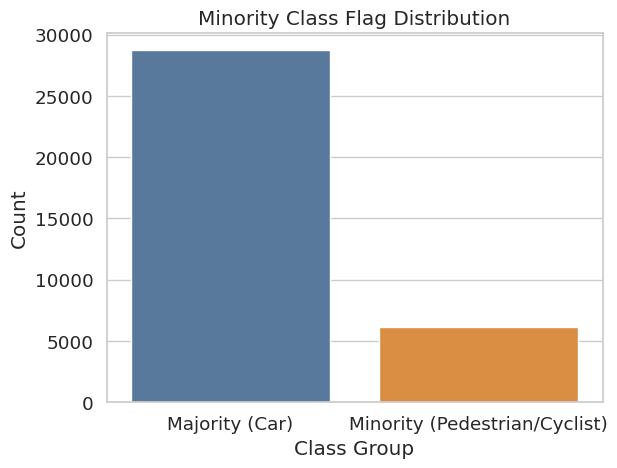

In [145]:
df["is_minority"] = df["class_id"].apply(lambda x: 1 if x in [1,2] else 0)

sns.countplot(data=df,x="is_minority",palette={0: "#4E79A7",1: "#F28E2B"} )
plt.xticks([0,1], ["Majority (Car)", "Minority (Pedestrian/Cyclist)"])
plt.title("Minority Class Flag Distribution")
plt.xlabel("Class Group")
plt.ylabel("Count")
plt.show()


# # Train vs Validation 

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


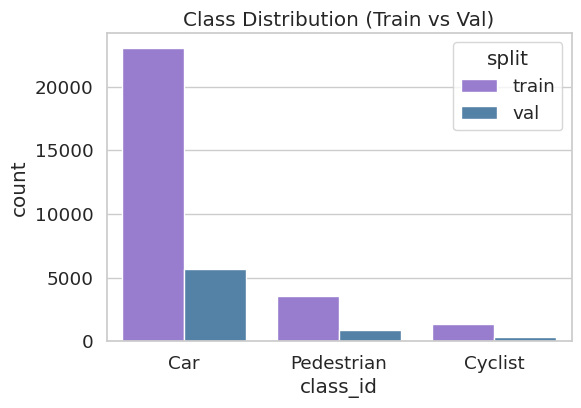

In [120]:
plt.figure(figsize=(6,4))
sns.countplot(data=df,x="class_id",hue="split",palette=["#9370DB", "#4682B4"])
plt.xticks([0,1,2], ['Car','Pedestrian','Cyclist'])
plt.title("Class Distribution (Train vs Val)")
plt.show()


# Bounding Box Derived Features

In [85]:
df["bbox_area"] = df["width"] * df["height"]
df["aspect_ratio"] = df["width"] / df["height"]


In [127]:
df.head()


,split,image,class_id,x_center,y_center,width,height,bbox_area,aspect_ratio
0,train,000000.png,1,0.622194,0.609351,0.080335,0.445730,0.035808,0.180232
1,train,000001.png,0,0.326667,0.512880,0.029130,0.057547,0.001676,0.506195
2,train,000001.png,2,0.549750,0.477173,0.009968,0.079947,0.000797,0.124683
3,train,000002.png,0,0.546481,0.551360,0.034364,0.088693,0.003048,0.387449
4,train,000005.png,1,0.278112,0.556507,0.024726,0.159733,0.003950,0.154796


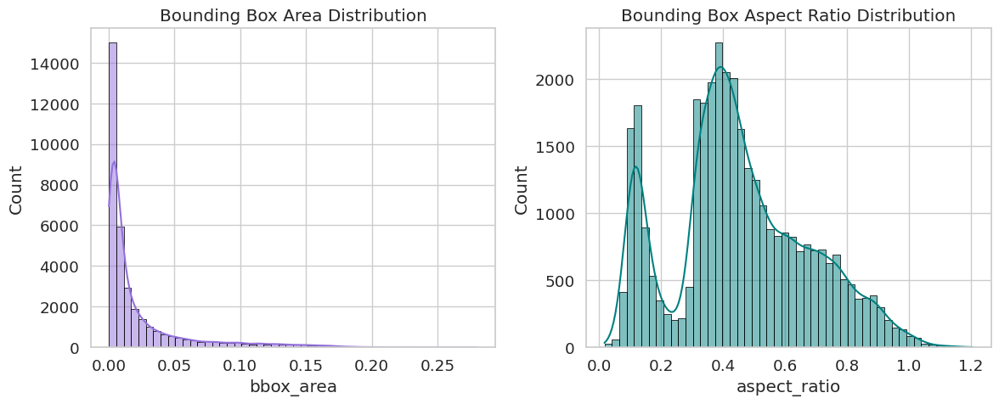

In [107]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df["bbox_area"],bins=50,kde=True,color="#9370DB",edgecolor="black")

plt.title("Bounding Box Area Distribution")

plt.subplot(1,2,2)
sns.histplot(df["aspect_ratio"],bins=50,kde=True,color="#008080",edgecolor="black")
plt.title("Bounding Box Aspect Ratio Distribution")

plt.tight_layout()
plt.show()


# Bounding Box Visualization 

In [147]:
def show_image_with_bboxes(image_name, df, images_dir):
    sub = df[df["image"] == image_name]
    img_path = os.path.join(images_dir, image_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape

    for _, row in sub.iterrows():
        x, y, bw, bh = row["x_center"], row["y_center"], row["width"], row["height"]
        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)

        cls = row["class_id"]
        color = (0,255,0) if cls==0 else (255,0,0) if cls==1 else (0,0,255)
        label = "Car" if cls==0 else "Pedestrian" if cls==1 else "Cyclist"

        cv2.rectangle(img, (x1,y1), (x2,y2), color, 2)
        cv2.putText(img, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, color, 2, cv2.LINE_AA)

    plt.figure(figsize=(10,6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Bounding Boxes in {image_name}")
    plt.show()


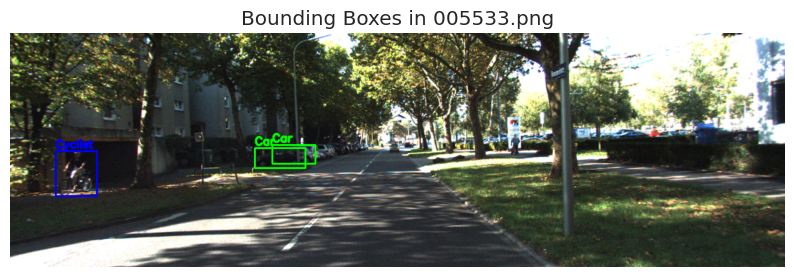

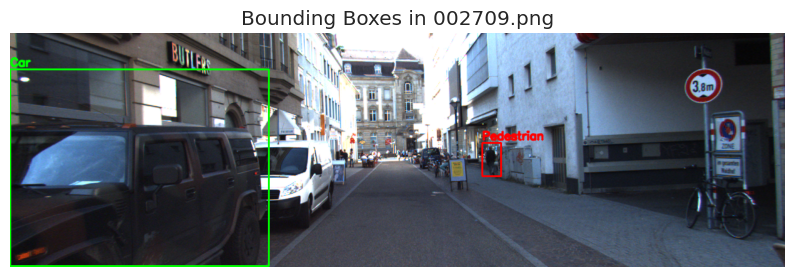

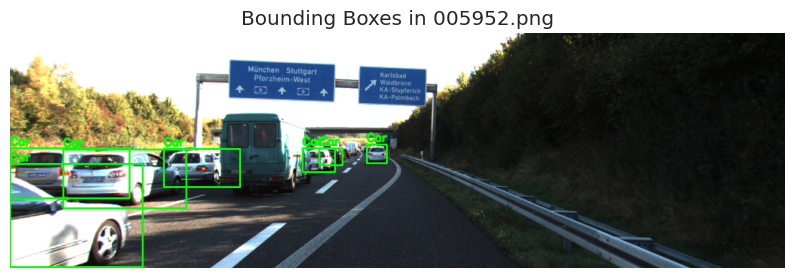

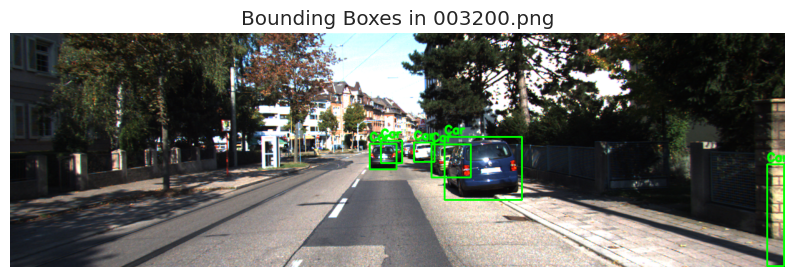

In [154]:
import random
for img_name in random.sample(df['image'].unique().tolist(), 4):
    show_image_with_bboxes(img_name, df, str(IMAGES_DIR))


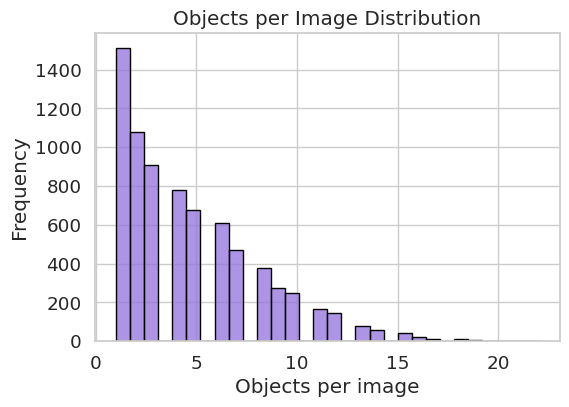

Avg objects per image: 4.657398743483491
Max objects in an image: 22


In [104]:
objs_per_img = df.groupby("image")["class_id"].count().reset_index(name="num_objects")

plt.figure(figsize=(6,4))
sns.histplot(objs_per_img["num_objects"],bins=30,color="#9370DB",edgecolor="black")
plt.title("Objects per Image Distribution")
plt.xlabel("Objects per image")
plt.ylabel("Frequency")
plt.show()

print("Avg objects per image:", objs_per_img["num_objects"].mean())
print("Max objects in an image:", objs_per_img["num_objects"].max())


# Bounding Box Area per Class

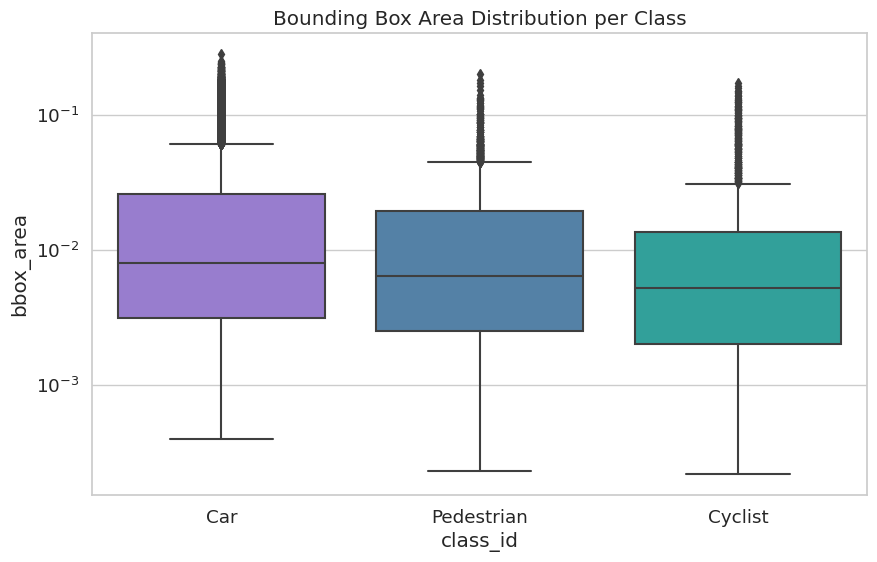

In [101]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df,x="class_id",y="bbox_area",palette={0: "#9370DB",1: "#4682B4",2: "#20B2AA"})

plt.xticks([0,1,2], ['Car','Pedestrian','Cyclist'])
plt.yscale("log")  
plt.title("Bounding Box Area Distribution per Class")
plt.show()


# Object Center Heatmaps 

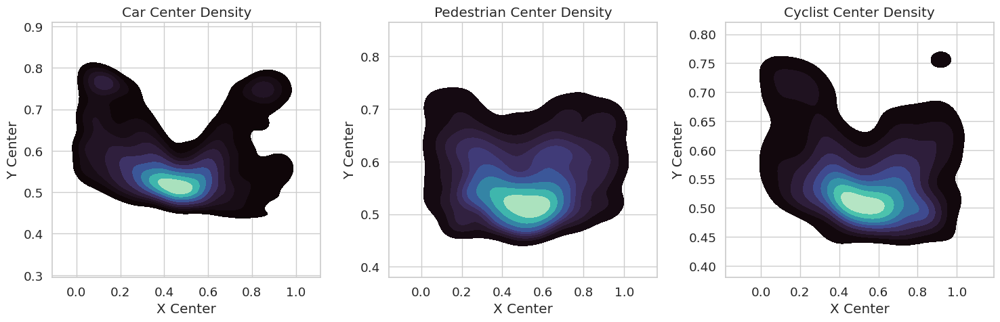

In [96]:
plt.figure(figsize=(15,5))

for i, cls in enumerate(['Car','Pedestrian','Cyclist']):
    plt.subplot(1,3,i+1)
    subset = df[df["class_id"]==i]
    sns.kdeplot(x=subset["x_center"], y=subset["y_center"], cmap="mako", fill=True, thresh=0.05)
    plt.title(f"{cls} Center Density")
    plt.xlabel("X Center")
    plt.ylabel("Y Center")

plt.tight_layout()
plt.show()


# Combined Object Center Heatmap

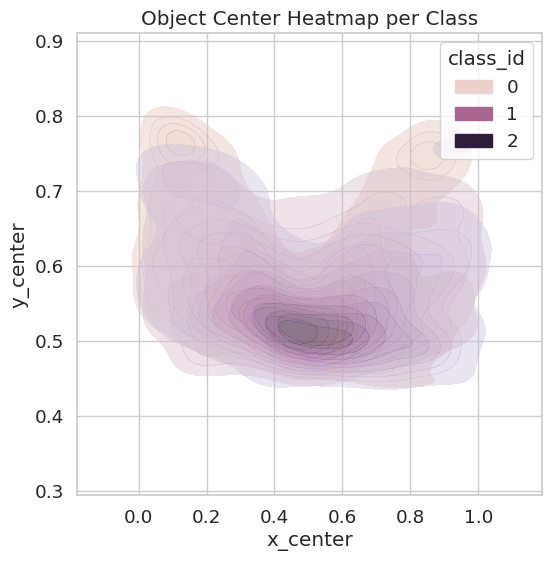

In [112]:
plt.figure(figsize=(6,6))
sns.kdeplot(
    data=df, x="x_center", y="y_center",
    hue="class_id", fill=True, common_norm=False, alpha=0.4
)
plt.title("Object Center Heatmap per Class")
plt.show()


# Visualizing Object Centers on Random Images 

In [143]:
def show_object_centers(image_name, df, images_dir): 
    sub = df[df["image"] == image_name]
    img_path = os.path.join(images_dir, image_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape

    plt.imshow(img)
    for _, row in sub.iterrows():
        cx = int(row["x_center"] * w)
        cy = int(row["y_center"] * h)
        cls = row["class_id"]

        color = "lime" if cls==0 else "orange" if cls==1 else "red"
        label = "Car" if cls==0 else "Pedestrian" if cls==1 else "Cyclist"

        plt.scatter(cx, cy, c=color, s=50, edgecolors="black")

    plt.title(f"Object Centers in {image_name}")
    plt.axis("off")


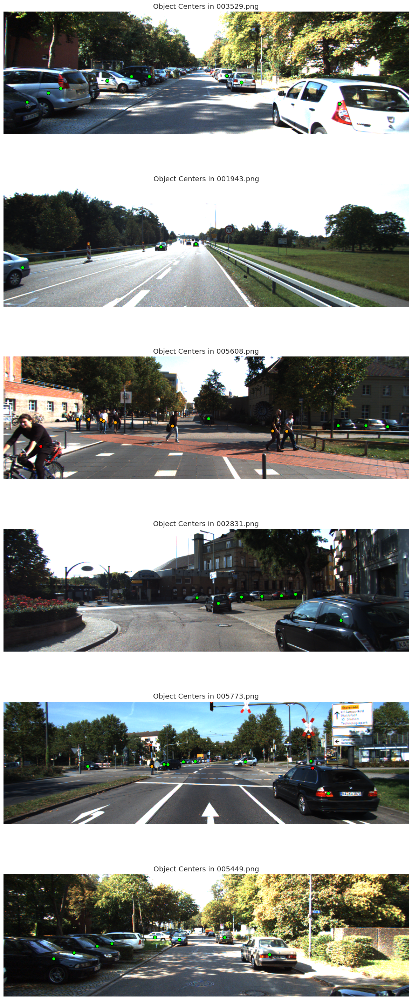

In [144]:
random_imgs = df["image"].drop_duplicates().sample(6, random_state=42).tolist()

plt.figure(figsize=(12, 30))  
for i, img_name in enumerate(random_imgs, 1):
    plt.subplot(6, 1, i)  
    show_object_centers(img_name, df, str(IMAGES_DIR))

plt.tight_layout()
plt.show()

# Crowded Images & Rare Classes 

In [97]:
top_imgs = objs_per_img.sort_values("num_objects", ascending=False).head(5)
print("\nTop crowded images:\n", top_imgs)

rare_class_imgs = class_diversity[class_diversity["num_classes"] == 1]
print("\nImages with only one class:", len(rare_class_imgs))



Top crowded images:
            image  num_objects
4139  004139.png           22
5663  005663.png           21
4747  004747.png           20
3219  003219.png           20
6422  006422.png           20

Images with only one class: 5642


In [168]:
def show_image_with_stats(image_name, df, images_dir):
    sub = df[df["image"] == image_name]
    img_path = os.path.join(images_dir, image_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    h, w, _ = img.shape
    for _, row in sub.iterrows():
        x, y, bw, bh = row["x_center"], row["y_center"], row["width"], row["height"]
        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)

        cls = row["class_id"]
        color = (0,255,0) if cls==0 else (255,0,0) if cls==1 else (0,0,255)
        label = "Car" if cls==0 else "Pedestrian" if cls==1 else "Cyclist"

        cv2.rectangle(img, (x1,y1), (x2,y2), color, 2)
        cv2.putText(img, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 
                    0.6, color, 2, cv2.LINE_AA)

    counts = sub["class_id"].value_counts().to_dict()
    num_cars = counts.get(0, 0)
    num_pedestrians = counts.get(1, 0)
    num_cyclists = counts.get(2, 0)
    total_objects = len(sub)

    plt.figure(figsize=(8,6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Image: {image_name} | Total: {total_objects} | Cars: {num_cars} | Pedestrians: {num_pedestrians} | Cyclists: {num_cyclists}")
    plt.show()

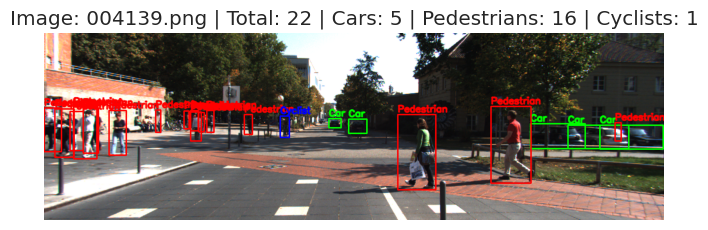

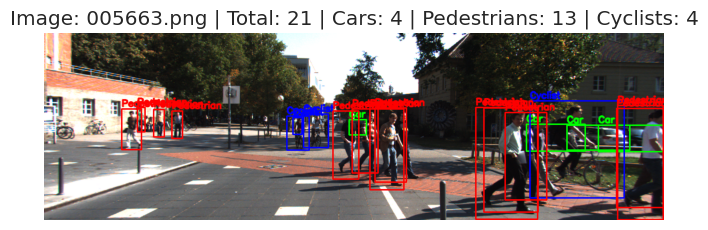

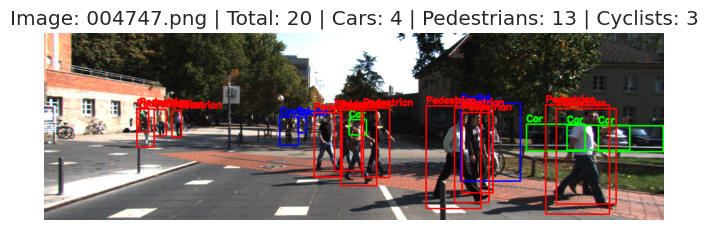

In [169]:
top_imgs = objs_per_img.sort_values("num_objects", ascending=False).head(3)
for img_name in top_imgs["image"]:
    show_image_with_stats(img_name, df, str(IMAGES_DIR))

# Summary

In [98]:
print("Total images:", df["image"].nunique())
print("Total objects:", len(df))

print("\nObjects per class:\n", df["class_id"].value_counts())
print("\nAvg objects per image:", objs_per_img["num_objects"].mean())
print("Max objects in an image:", objs_per_img["num_objects"].max())

print("\nClass diversity per image:\n", class_diversity["num_classes"].value_counts().sort_index())


Total images: 7481
Total objects: 34842

Objects per class:
 class_id
0    28731
1     4484
2     1627
Name: count, dtype: int64

Avg objects per image: 4.657398743483491
Max objects in an image: 22

Class diversity per image:
 num_classes
1    5642
2    1555
3     284
Name: count, dtype: int64
